1. Data loaeding and preprocessing

In [1]:
# Loading and cleaning
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sys
sys.path.append(r'C:\Frank\UoT 2024-2025\MIE8888 Project\M18\RUIWU') 
from helper_functions import * # Import Ruiwu's helper functions for data cleaning, slicing and aggregating

full_dataset = r"C:\Frank\UoT 2024-2025\MIE8888 Project\full_dataset_2.11.csv"
df = pd.read_csv(full_dataset, encoding="Windows-1252")

# Define trash columns
trash_columns = ['id_x_x','sikka_sub_task_operation_x_x','office_x_x','guarantor_x','patient','description','visible_to_patient','primary_insurance_estimate','secondary_insurance_estimate','plan_sr_no','insurance_payment','approved','from_pms_x_x','id_y_x','from_pms_y_x','sikka_sub_task_y_x','sikka_sub_task_operation_y_x','uuid','guarantor_y','office_y_x','fullname','first_name','last_name','address','phone','zip_code','practice','primary_insurance_company_id','profile_picture','date_joined','zip_code_flag','address_comp','final_zip_code','id_x_y','from_pms_x_y','office_x_y','treatment','id_y_y','from_pms_y_y','sikka_sub_task_y_y','sikka_sub_task_operation_y_y','office_y_y','procedure_code_x','procedure_code_description','patient_friendly_description','treatment_id','price','fetched_zip_code_flag','zip_code_verified','fetched_zip_code', 'entry_date', 'tooth_from']

df = drop_high_nan_columns(df) 
df = df.drop(columns = trash_columns) # Drop trash cols
df = merge_columns_with_priority(df,'health_category','procedure_code_category','treatment_category') # merge to get treatment_category with pattern from two category groups
df = df.dropna() # Drop the remaining NA
df, df_dict = object_processing(df) # Project columns dtype = object; For columns containing datetime, convert it to pd.datetime; For other object columns, encode them
df = days_cal(df,'procedure_date','birth_date', 'procedure_age') # age group preparation (modify to int)
df = days_cal(df,'last_visit','first_visit','visit_period')

# # Perform one-hot encoding on the "procedure_code_y" and "treatment_category"
df = one_hot_encode_procedure_and_treatment(df)
# df.to_csv(r'C:\Frank\UoT 2024-2025\MIE8888 Project\M18\output.csv', index=False)

df_next = df.copy() # for next step use

C:\Users\frank\AppData\Local\Temp\ipykernel_12908\2822141788.py:10: DtypeWarning: Columns (1,4,10,16,52,85,86,91) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(full_dataset, encoding="Windows-1252")
C:\Frank\UoT 2024-2025\MIE8888 Project\M18\RUIWU\helper_functions.py:41: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  temp_dt = pd.to_datetime(df[col], errors='raise')
C:\Frank\UoT 2024-2025\MIE8888 Project\M18\RUIWU\helper_functions.py:41: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  temp_dt = pd.to_datetime(df[col], errors='raise')
C:\Frank\UoT 2024-2025\MIE8888 Project\M18\RUIWU\helper_functions.py:41: UserWarning: Could not infer format, so each element will be pa

2. Create a complete dataset to reflect each patient_id's treatment pattern

In [8]:
meta_cols = ['provider_x', 'amount', 'treatment_plan_status', 'patient_id', 'city','state_y', 'sikka_provider_id', 'LATITUDE', 'LONGITUDE', 'procedure_age', 'visit_period']

# Select relevant columns
base_cols = ['patient_id', 'procedure_age']
procedure_cols = [col for col in df_next.columns if col.startswith('procedure_code_y_') or col.startswith('treatment_category_')]
df_subset = df_next[base_cols + procedure_cols].copy()
df_subset['procedure_age'] = df_subset['procedure_age'].astype(int) # procedure_age to int

# Melt one-hot to long format
df_long = df_subset.melt(
    id_vars=['patient_id', 'procedure_age'],
    value_vars=procedure_cols,
    var_name='procedure_code',
    value_name='occurred'
)

# Keep only rows where procedure occurred
df_long = df_long[df_long['occurred'] == 1]

# Create combined feature name
df_long['feature'] = df_long['procedure_code'] + '_age' + df_long['procedure_age'].astype(str)

# Pivot to wide format
final_df = df_long.groupby(['patient_id', 'feature']).size().unstack(fill_value=0)
final_df = final_df.reset_index()

# Get metadata (take first row per patient) # may need further fixing if the information for such patient changed over times
patient_meta = df_next[meta_cols].groupby('patient_id').first().reset_index()
final_df = pd.merge(patient_meta, final_df, on='patient_id', how='left')

In [9]:
final_df

,patient_id,provider_x,amount,treatment_plan_status,city,state_y,sikka_provider_id,LATITUDE,LONGITUDE,procedure_age,...,treatment_category_9_age88,treatment_category_9_age89,treatment_category_9_age9,treatment_category_9_age90,treatment_category_9_age91,treatment_category_9_age92,treatment_category_9_age93,treatment_category_9_age95,treatment_category_9_age96,treatment_category_9_age99
0,1,1,663.00,1,0,0,0,43.818875,-79.559466,55,...,0,0,0,0,0,0,0,0,0,0
1,2,7,77.19,0,0,0,0,43.818875,-79.559466,41,...,0,0,0,0,0,0,0,0,0,0
2,3,5,19.96,0,0,0,0,43.818875,-79.559466,24,...,0,0,0,0,0,0,0,0,0,0
3,4,7,55.49,0,0,0,0,43.835469,-79.555076,15,...,0,0,0,0,0,0,0,0,0,0
4,5,1,220.00,1,0,0,0,43.818875,-79.559466,20,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10253,13579,10,8.75,1,0,0,0,43.838741,-79.563329,10,...,0,0,0,0,0,0,0,0,0,0
10254,13580,10,30.15,1,0,0,0,43.838741,-79.563329,6,...,0,0,0,0,0,0,0,0,0,0
10255,13583,11,160.14,0,12,0,0,43.840925,-79.551739,8,...,0,0,0,0,0,0,0,0,0,0
10256,13584,2,0.00,2,9,0,2,43.671953,-79.399170,39,...,0,0,0,0,0,0,0,0,0,0


Applied Truncated SVD which is the best for sparse binary data of large sparse matrices.

In [10]:
from sklearn.decomposition import TruncatedSVD
from scipy.sparse import csr_matrix

# columns to exclude from SVD
non_binary_cols = ['provider_x', 'amount', 'treatment_plan_status', 'patient_id', 'city','state_y', 'sikka_provider_id', 'LATITUDE', 'LONGITUDE','procedure_age', 'visit_period']
meta_df = final_df[non_binary_cols].copy()
binary_df = final_df.drop(columns=non_binary_cols)

# Apply TruncatedSVD on binary columns
X_sparse = csr_matrix(binary_df.values)
svd = TruncatedSVD(n_components=100, random_state=823)
X_svd = svd.fit_transform(X_sparse)

svd_features = pd.DataFrame(X_svd, columns=[f"SVD_{i+1}" for i in range(X_svd.shape[1])])
df_svd = pd.concat([meta_df.reset_index(drop=True), svd_features], axis=1)

In [11]:
df_svd

,provider_x,amount,treatment_plan_status,patient_id,city,state_y,sikka_provider_id,LATITUDE,LONGITUDE,procedure_age,...,SVD_91,SVD_92,SVD_93,SVD_94,SVD_95,SVD_96,SVD_97,SVD_98,SVD_99,SVD_100
0,1,663.00,1,1,0,0,0,43.818875,-79.559466,55,...,0.129302,-0.679257,1.310237,0.418749,-0.268478,-0.459666,-0.326420,1.408708,0.994770,0.192471
1,7,77.19,0,2,0,0,0,43.818875,-79.559466,41,...,-0.654086,0.537491,1.120165,-1.128762,-1.012749,-0.084358,-0.711287,-0.395388,0.613275,0.074925
2,5,19.96,0,3,0,0,0,43.818875,-79.559466,24,...,-0.204574,-0.109031,-0.210161,0.171720,-0.255636,-0.013390,0.474894,0.300367,-0.243592,0.265608
3,7,55.49,0,4,0,0,0,43.835469,-79.555076,15,...,0.918200,-0.409798,0.146121,-0.312076,-0.171364,0.058218,-1.386143,-0.632145,-0.839857,1.715160
4,1,220.00,1,5,0,0,0,43.818875,-79.559466,20,...,-0.086875,-0.040611,-0.077501,-0.113327,0.063478,0.000552,-0.151971,0.158655,0.031298,0.016163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10253,10,8.75,1,13579,0,0,0,43.838741,-79.563329,10,...,-0.068137,0.276409,0.101999,0.251203,0.078569,-0.247758,-0.088183,-0.133617,0.008568,-0.066537
10254,10,30.15,1,13580,0,0,0,43.838741,-79.563329,6,...,-0.121298,-0.139158,0.051260,0.559763,-0.378192,0.501527,0.180905,-0.128073,0.051764,-0.046494
10255,11,160.14,0,13583,12,0,0,43.840925,-79.551739,8,...,-0.036826,-0.026531,-0.019474,0.025020,0.052504,0.037267,0.025919,-0.034039,0.031956,-0.011931
10256,2,0.00,2,13584,9,0,2,43.671953,-79.399170,39,...,0.023530,-0.026105,0.016765,-0.005024,0.015098,0.032073,-0.010145,-0.012431,0.015550,0.046990


3. Dataframe for 17 age groups, start from 5-10, up to 85-90


In [7]:
def age_to_group(age):
    try:
        age = int(age)
        if age < 0:
            return "invalid"
        lower = (age // 5) * 5
        upper = lower + 5
        if lower > upper:
            return "invalid"
        return f"{lower}-{upper}"
    except:
        return "invalid"

df['age_group'] = df['procedure_age'].apply(age_to_group)

import os
# Create output directory if it doesn't exist
output_dir = r"C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe"
os.makedirs(output_dir, exist_ok=True)

# Split and save each group
for group_name, group_df in df.groupby('age_group'):
    filename = f"{output_dir}/age_group_{group_name}.csv"
    group_df.to_csv(filename, index=False)
    print(f"Saved: {filename}")

Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_0-5.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_10-15.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_15-20.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_20-25.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_25-30.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_30-35.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_35-40.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_40-45.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_45-50.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_5-10.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_50-55.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split d

4. Clustering, using dataset age_30_35 as one example

In [ ]:
df_30_35  = pd.read_csv(r"C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe\age_group_30-35.csv")
binary_cols = [col for col in df_30_35 .columns if (col.startswith('procedure_code_y_') or col.startswith('treatment_category_'))]

# Group by patient and aggregate with sum
agg_binary = df_30_35 .groupby("patient_id")[binary_cols].sum()

# Combine each patient's SVD with their age-group treatments
df_combined = pd.merge(agg_binary, df_svd, on='patient_id', how='left') # keep all patients from your age group and match SVD if available

AttributeError: 'NoneType' object has no attribute 'split'

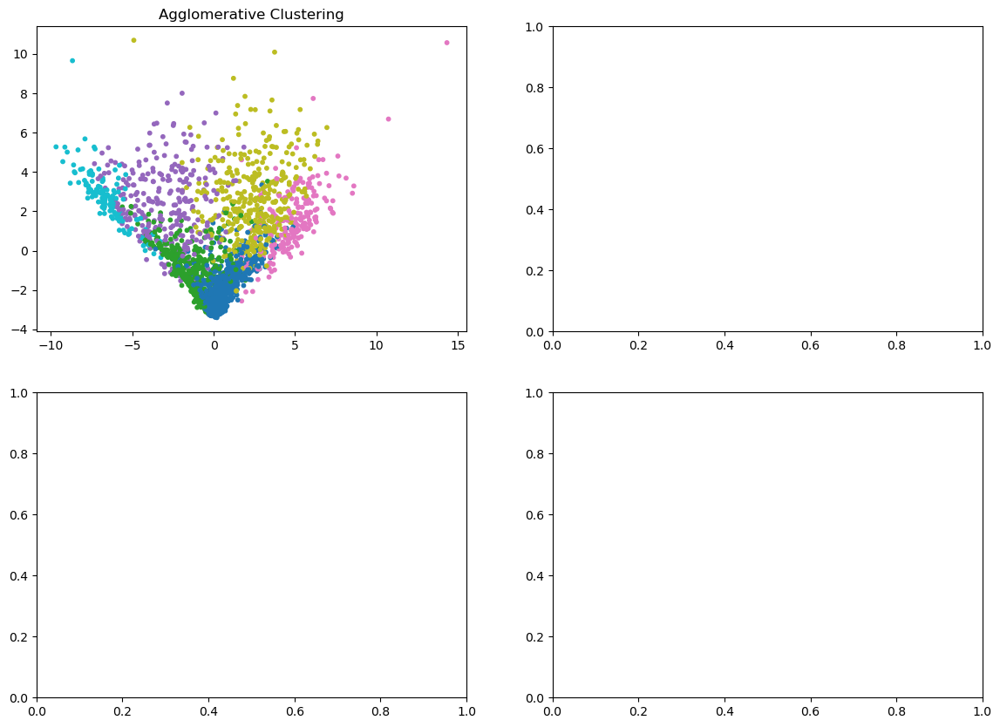

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Step 1: Feature selection
svd_cols = [col for col in df_combined.columns if col.startswith("SVD_")]
X = df_combined[svd_cols]

# Step 2: Dimensionality reduction for 2D visualization
# Option A: PCA (faster)
pca = PCA(n_components=2)
X_vis = pca.fit_transform(X)

# Step 3: Try different clustering algorithms
clustering_methods = {
    # 'KMeans': KMeans(n_clusters=6, random_state=42),
    'Agglomerative': AgglomerativeClustering(n_clusters=6),
    'DBSCAN': DBSCAN(eps=3, min_samples=5),
    # 'GMM': GaussianMixture(n_components=6, random_state=42)
}

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, (name, model) in enumerate(clustering_methods.items()):
    if name == 'GMM':
        labels = model.fit_predict(X)
    else:
        labels = model.fit_predict(X)
    
    # Store cluster labels if needed
    df_combined[f'{name}_cluster'] = labels
    
    # Plot
    axes[i].scatter(X_vis[:, 0], X_vis[:, 1], c=labels, cmap='tab10', s=10)
    axes[i].set_title(f"{name} Clustering")

plt.suptitle("Clustering Comparison on SVD Features", fontsize=16)
plt.tight_layout()
plt.show()
